# Coca Cola Stock Analysis

### Import Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
plt.style.use('fivethirtyeight')
%matplotlib inline

# For reading stock data from yahoo
from pandas_datareader.data import DataReader

# For time stamps
from datetime import datetime
from math import sqrt

from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler

# Ignore the warnings
import warnings
warnings.filterwarnings('ignore')

### Load Dataset

In [3]:
KO_Data=pd.read_csv('Coca-Cola_stock_history.csv')

### Basic EDA

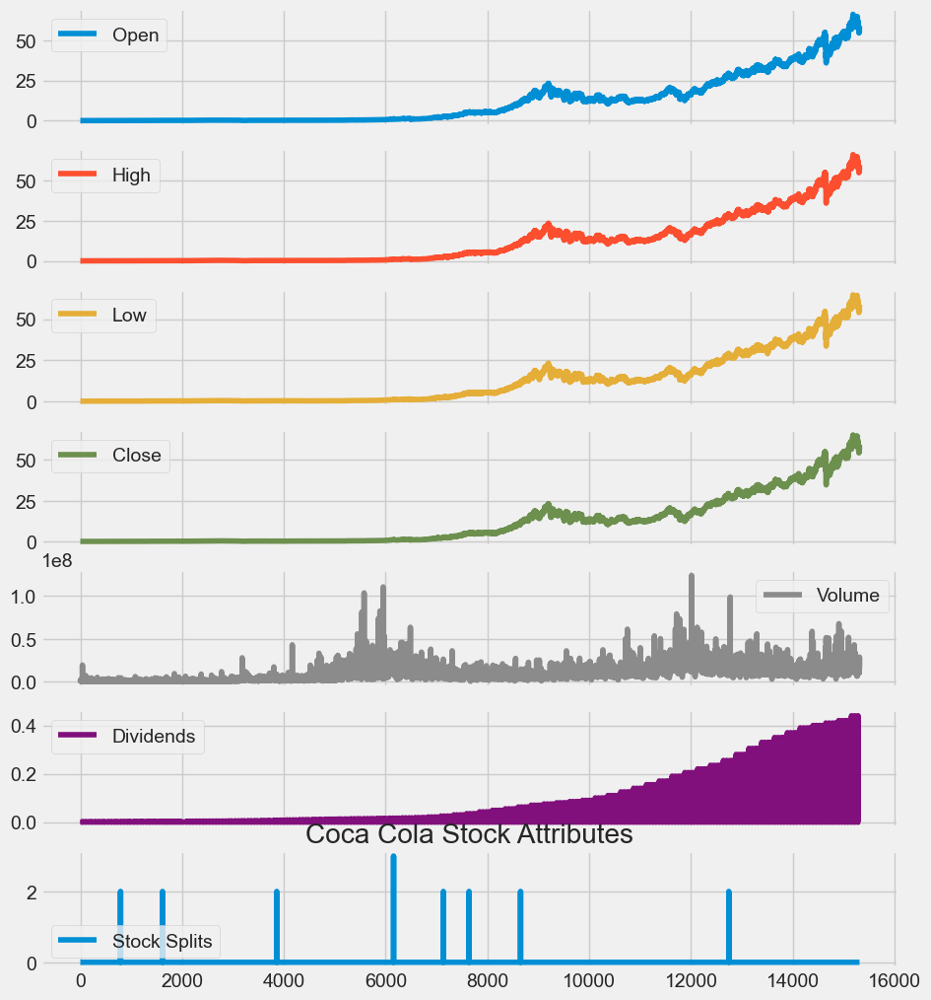

In [4]:
KO_Data.plot(subplots=True,figsize=(10,12))
plt.title('Coca Cola Stock Attributes')
plt.show()

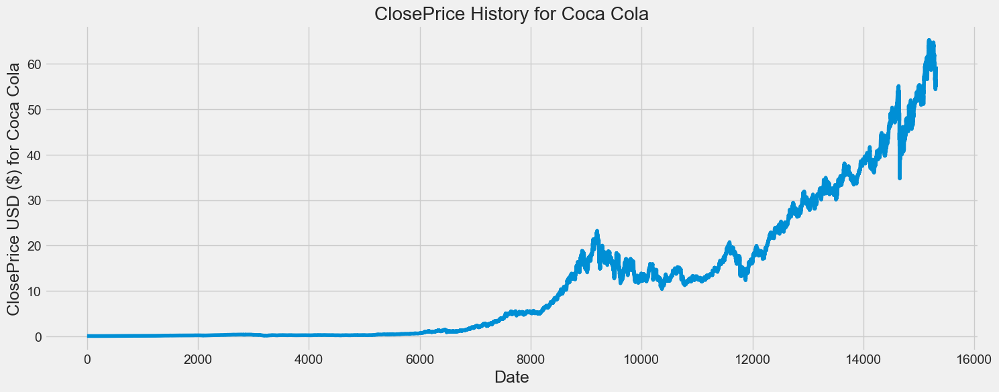

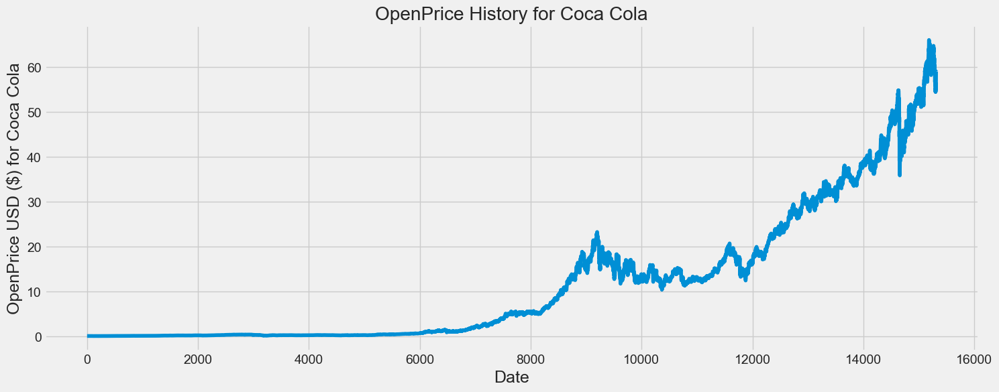

In [5]:
def plot_close_val(data_frame,column,stock):
    plt.figure(figsize=(16,6))
    plt.title(column+'Price History for ' +stock)
    plt.plot(data_frame[column])
    plt.xlabel('Date',fontsize=18)
    plt.ylabel(column+'Price USD ($) for ' +stock,fontsize=18)
    plt.show()

    # Test the function
plot_close_val(KO_Data,'Close','Coca Cola')
plot_close_val(KO_Data,'Open','Coca Cola')

    

<Axes: >

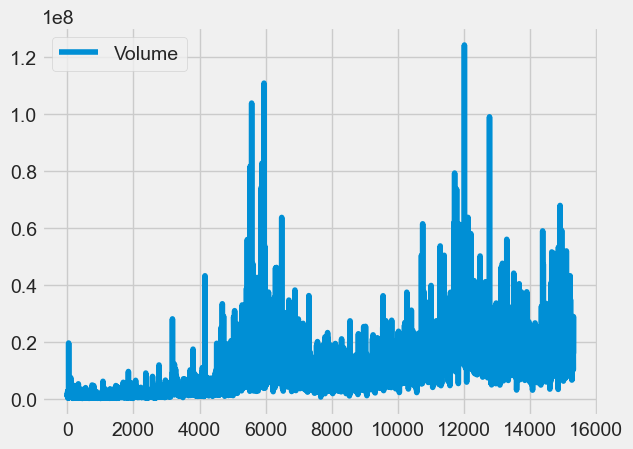

In [6]:
KO_Data[['Volume']].plot()

### Basic Company Info

In [7]:
ko_info=pd.read_csv('Coca-Cola_stock_info.csv',header=None,names=(['Description','Information']))
ko_info.dropna()
ko_info.drop(ko_info.loc[ko_info['Information']=='nan'].index,inplace=True)
ko=ko_info.sort_values('Information').style
ko

,Description,Information
49,gmtOffSetMilliseconds,-18000000
145,bid,0
138,ask,0
77,heldPercentInsiders,0.00636
68,sharesPercentSharesOut,0.0074
100,shortPercentOfFloat,0.0074
108,trailingAnnualDividendYield,0.027917083
147,dividendYield,0.028099999
29,returnOnAssets,0.07831
75,SandP52WeekChange,0.15025425


### Basic CAGR

#### 1. Basic Rolling Averages

In [8]:
# Isolate the adjusted closing prices
adj_close_px=KO_Data['Close']

#Calculate the moving average
moving_avg=adj_close_px.rolling(window=40).mean()

# Inspect the result
moving_avg[-10:]


15301    59.573229
15302    59.329031
15303    59.103823
15304    58.921440
15305    58.725320
15306    58.504966
15307    58.298918
15308    58.171838
15309    58.088689
15310    58.030935
Name: Close, dtype: float64

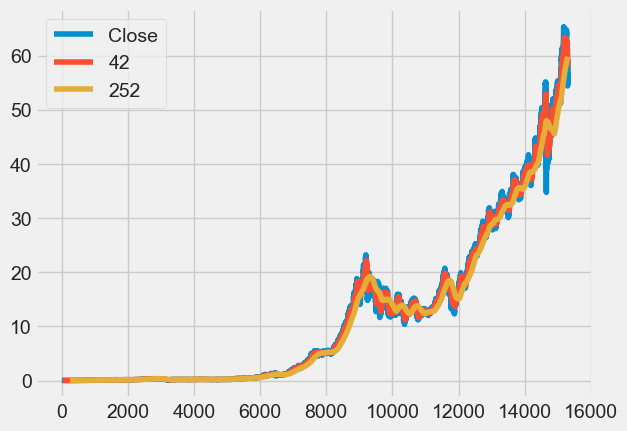

In [9]:
# Short moving window rolling mean
KO_Data['42']=adj_close_px.rolling(window=40).mean()

#long moving window rolling mean
KO_Data['252']=adj_close_px.rolling(window=252).mean()

# Plot the adjusted closing price,the short and long windows of rolling means
KO_Data[['Close','42','252']].plot()
plt.show()

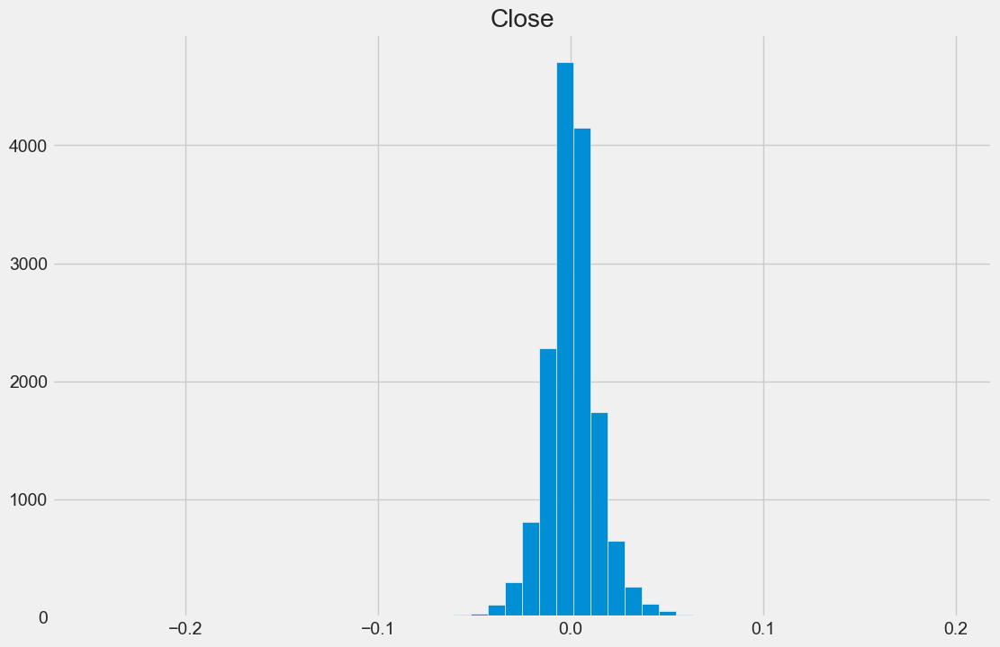

In [10]:
daily_close_px=KO_Data[['Close']]

# Calculate the daily percentage change for 'daily_close_px'
daily_pct_change=daily_close_px.pct_change()

# Plot the distributions
daily_pct_change.hist(bins=50,sharex=True,figsize=(12,8))

# Show the resulting plot
plt.show()


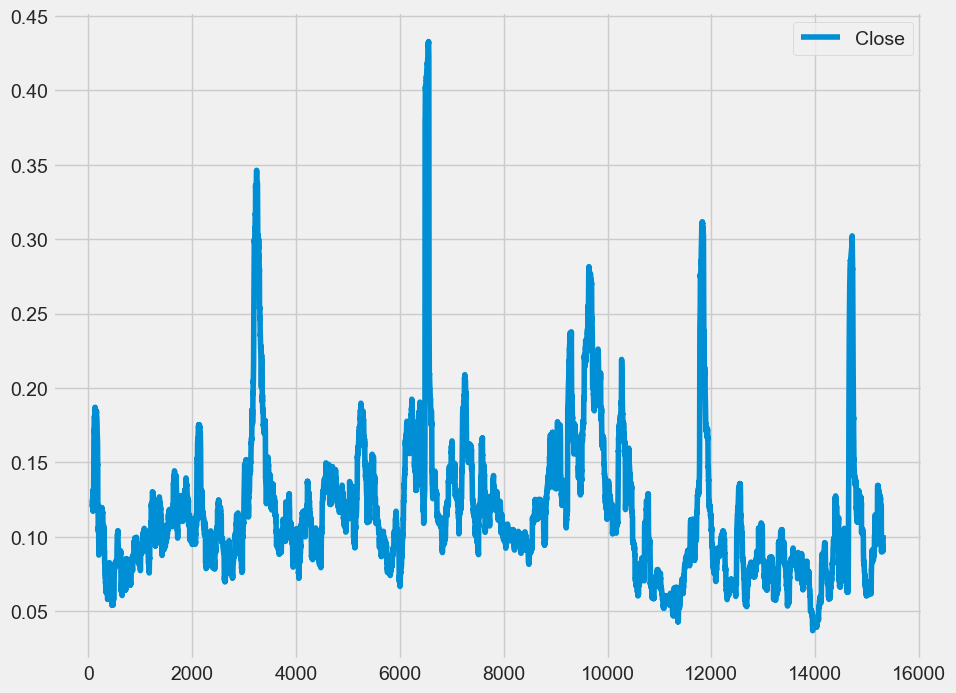

In [11]:
# Define the minimum of periods to consider
min_periods=75

# Calculate the volatility
np.sqrt(min_periods)

#Plot the volatility
vol=daily_pct_change.rolling(min_periods).std()*np.sqrt(min_periods)

# Plot the volatility
vol.plot(figsize=(10,8))

# Show the plot
plt.show()

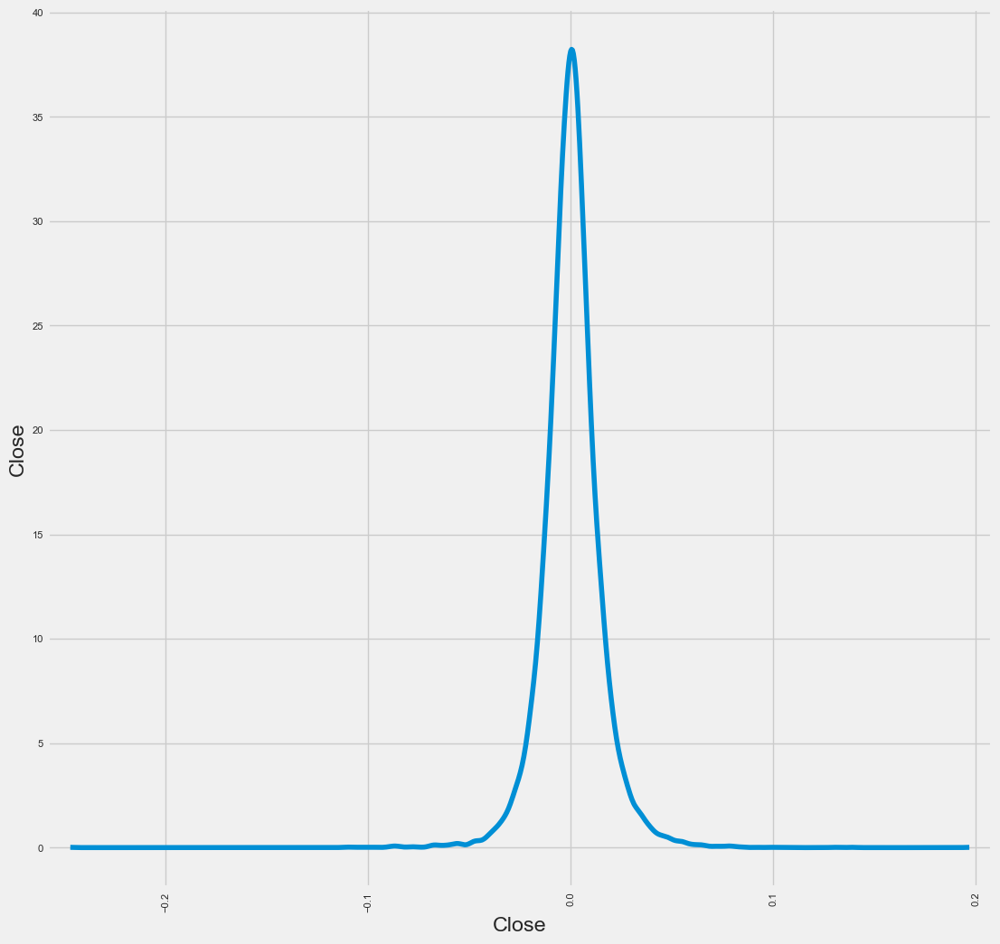

In [12]:
# Plot a scatter matrix with the 'daily_pct_change' data
pd.plotting.scatter_matrix(daily_pct_change,diagonal='kde',alpha=0.1,figsize=(12,12))

# Show the plot
plt.show()

#### 2. Basic MACD

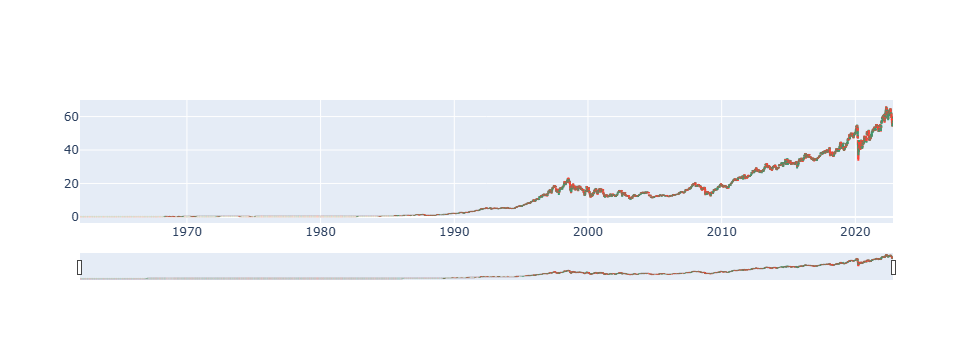

In [13]:
import plotly.graph_objects as go

KO_Data=KO_Data.reset_index()

fig=go.Figure(data=go.Ohlc(x=KO_Data['Date'],
            open=KO_Data['Open'],
            high=KO_Data['High'],
            low=KO_Data['Low'],
            close=KO_Data['Close']))
fig.show()
                           

##### 2.1 Basic SMA  -Simple Moving Average 

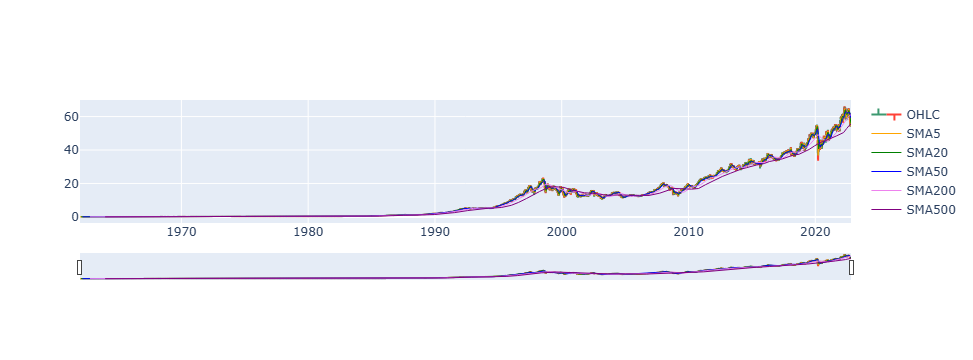

In [14]:
# KO_Data=KO_Data.reset_index()

KO_Data['SMA5']=KO_Data.Close.rolling(5).mean()
KO_Data['SMA20']=KO_Data.Close.rolling(20).mean()
KO_Data['SMA50']=KO_Data.Close.rolling(50).mean()
KO_Data['SMA200']=KO_Data.Close.rolling(200).mean()
KO_Data['SMA500']=KO_Data.Close.rolling(500).mean()

fig=go.Figure(data=[go.Ohlc(x=KO_Data['Date'],
            open=KO_Data['Open'],
            high=KO_Data['High'],
            low=KO_Data['Low'],
            close=KO_Data['Close'],
            name='OHLC'),
            go.Scatter(x=KO_Data.Date,y=KO_Data.SMA5,line=dict(color='orange',width=1),
                       name='SMA5'),
            go.Scatter(x=KO_Data.Date,y=KO_Data.SMA20,line=dict(color='green',width=1),
                       name='SMA20'), 
            go.Scatter(x=KO_Data.Date,y=KO_Data.SMA50,line=dict(color='blue',width=1),
                       name='SMA50'),
            go.Scatter(x=KO_Data.Date,y=KO_Data.SMA200,line=dict(color='violet',width=1),
                       name='SMA200'),
            go.Scatter(x=KO_Data.Date,y=KO_Data.SMA500,line=dict(color='purple',width=1),
                       name='SMA500')])
fig.show()
                    

##### 2.2 Basic EMA   -Exponential Moving Average

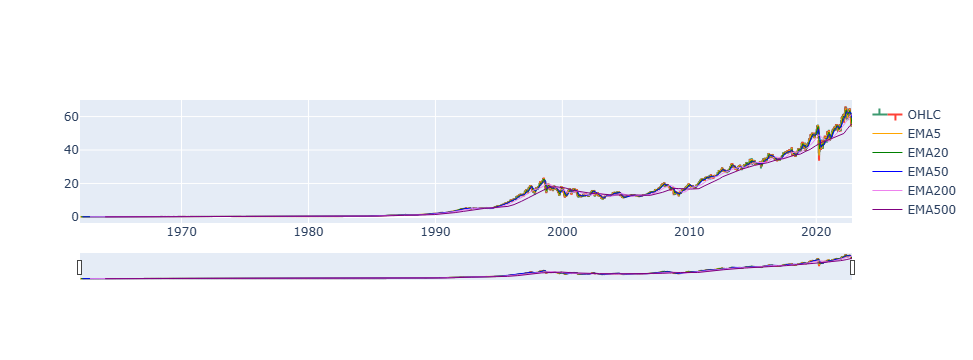

In [15]:
KO_Data['EMA5']=KO_Data.Close.ewm(span=5,adjust=False).mean()
KO_Data['EMA20']=KO_Data.Close.ewm(span=20,adjust=False).mean()
KO_Data['EMA50']=KO_Data.Close.ewm(span=50,adjust=False).mean()
KO_Data['EMA200']=KO_Data.Close.ewm(span=200,adjust=False).mean()
KO_Data['EMA500']=KO_Data.Close.ewm(span=500,adjust=False).mean()


fig = go.Figure(data=[go.Ohlc(x=KO_Data['Date'],
open=KO_Data['Open'],
high=KO_Data['High'],
low=KO_Data['Low'],
close=KO_Data['Close'], name =
"OHLC"),
   go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA5, line=dict(color='orange', width=1),
name="EMA5"),
  go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA20, line=dict(color='green', width=1),
name="EMA20"),
   go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA50, line=dict(color='blue', width=1),
name="EMA50"),
   go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA200, line=dict(color='violet', width=1),
name="EMA200"),
  go.Scatter(x=KO_Data.Date,
y=KO_Data.SMA500, line=dict(color='purple', width=1),
name="EMA500")])

fig.show()



In [16]:
KO_Data.head()
# KO_Data.fillna(0)
# KO_Data.set_index('Date')

,index,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,42,...,SMA5,SMA20,SMA50,SMA200,SMA500,EMA5,EMA20,EMA50,EMA200,EMA500
0,0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,0.050016,0.050016,0.050016,0.050016,0.050016
1,1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,0.049644,0.049910,0.049972,0.050005,0.050011
2,2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,0.049521,0.049849,0.049945,0.049998,0.050009
3,3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,0.049067,0.049688,0.049875,0.049979,0.050001
4,4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0,NaN,...,0.048803,NaN,NaN,NaN,NaN,0.048599,0.049495,0.049788,0.049956,0.049992


### FINTA Tech Analysis Ratios

Let us do a financial ratios calculation using FINTA library

In [17]:
from finta import TA
from backtesting import Backtest,Strategy
from backtesting.lib import crossover

In [18]:
fin_ma=pd.read_csv('Coca-Cola_stock_history.csv', parse_dates=True)
print(fin_ma.head())
ohlc=fin_ma
print(TA.SMA(ohlc,42))

# ohlc.index=ohlc[index].dt.date

         Date      Open      High       Low     Close   Volume  Dividends  \
0  1962-01-02  0.050016  0.051378  0.050016  0.050016   806400        0.0   
1  1962-01-03  0.049273  0.049273  0.048159  0.048902  1574400        0.0   
2  1962-01-04  0.049026  0.049645  0.049026  0.049273   844800        0.0   
3  1962-01-05  0.049273  0.049892  0.048035  0.048159  1420800        0.0   
4  1962-01-08  0.047787  0.047787  0.046735  0.047664  2035200        0.0   

   Stock Splits  
0             0  
1             0  
2             0  
3             0  
4             0  
0              NaN
1              NaN
2              NaN
3              NaN
4              NaN
           ...    
15306    58.759467
15307    58.572686
15308    58.422110
15309    58.297065
15310    58.219369
Name: 42 period SMA, Length: 15311, dtype: float64


Error in  Kaufmans Adaptive Moving Average : 'Series' object has no attribute 'iteritems'
Error in  Elastic Volume Moving Average : 'Series' object has no attribute 'iteritems'
Error in  Elastic-Volume weighted MACD : 'Series' object has no attribute 'iteritems'


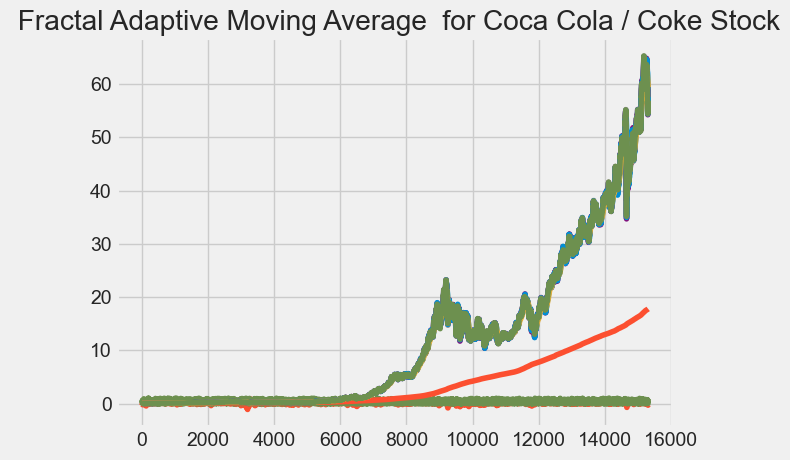

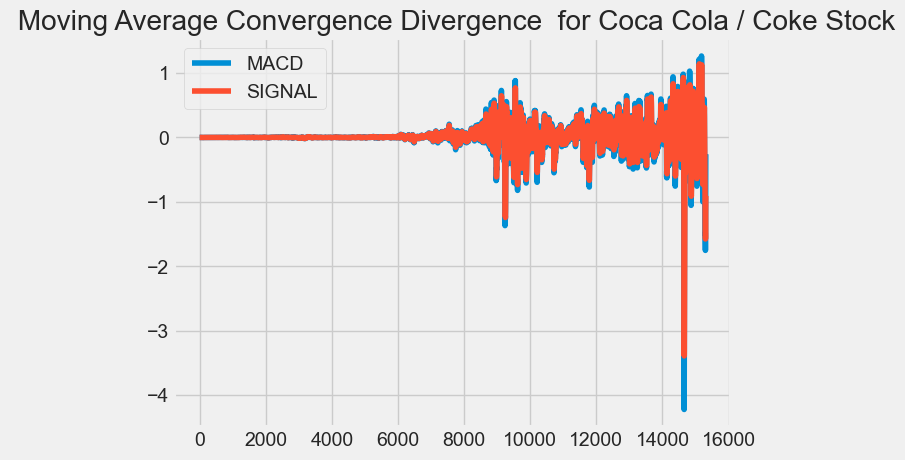

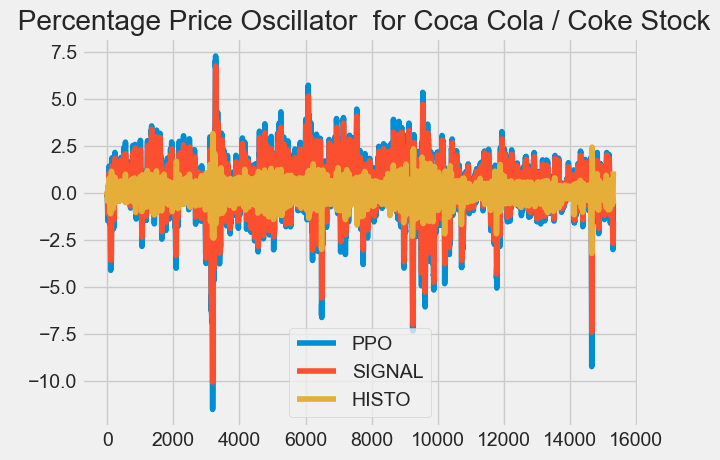

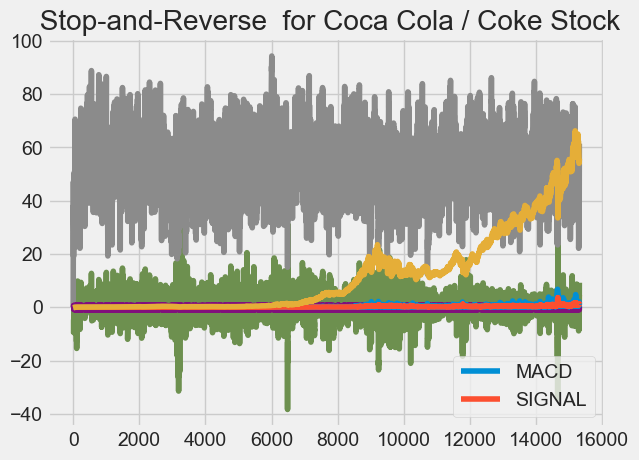

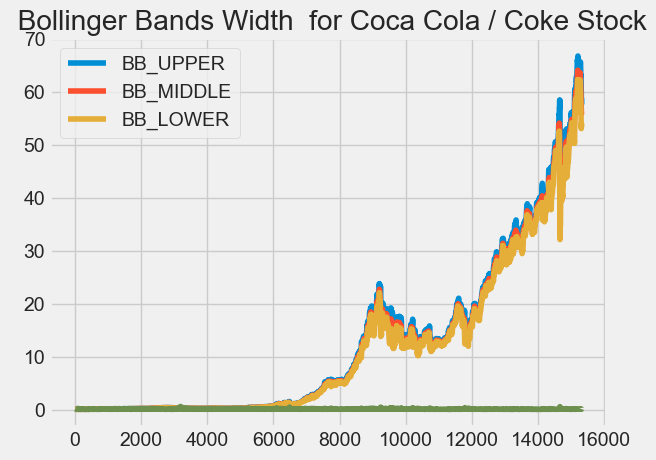

...

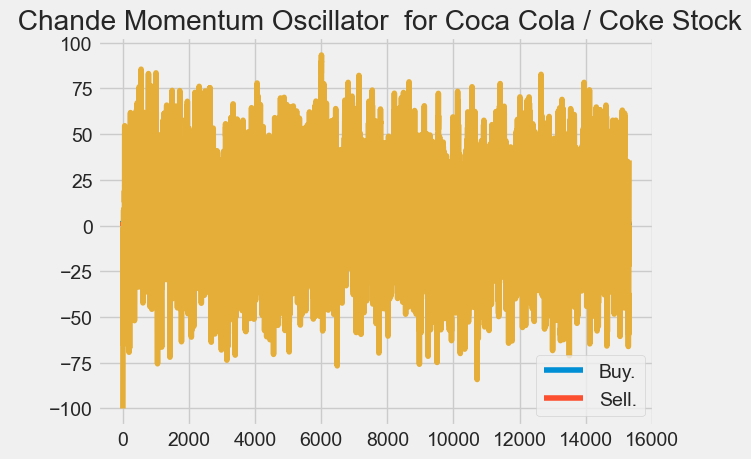

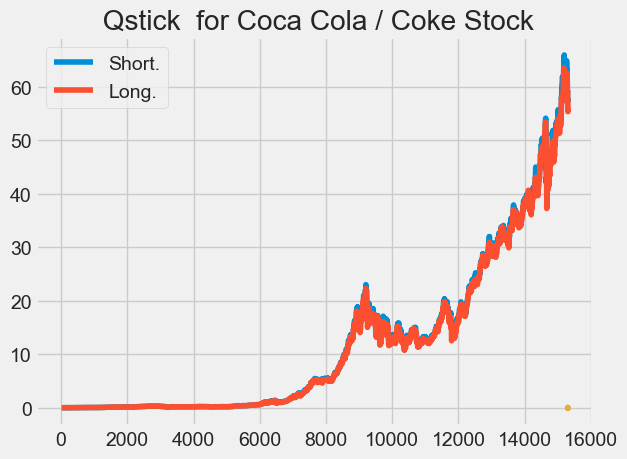

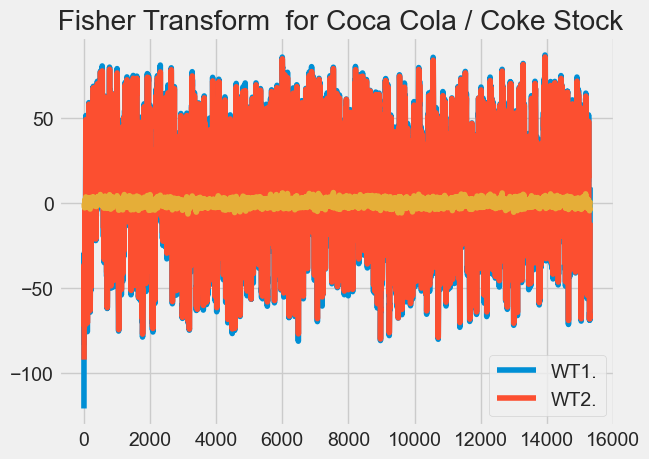

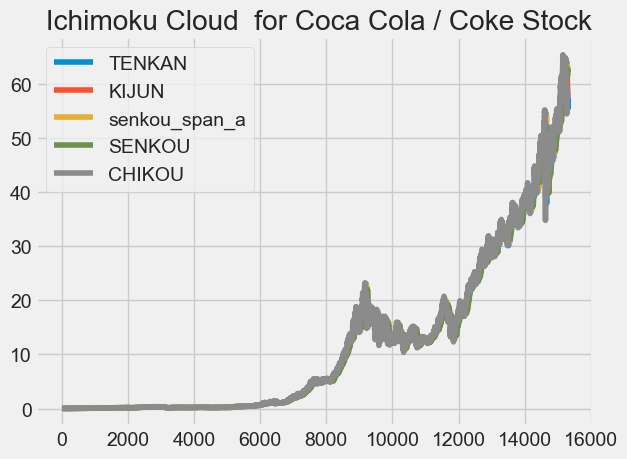

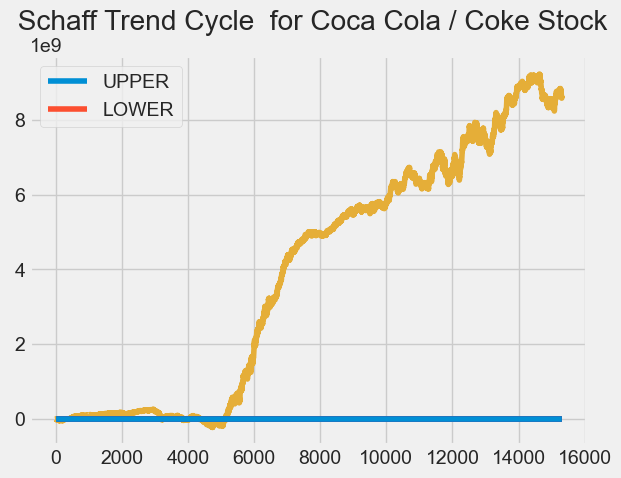

In [19]:
function_dict = {' Simple Moving Average ' : 'SMA',
' Simple Moving Median ' : 'SMM',
' Smoothed Simple Moving Average ' : 'SSMA',
' Exponential Moving Average ' : 'EMA',
' Double Exponential Moving Average ' :
'DEMA',
' Triple Exponential Moving Average ' :
'TEMA',
' Triangular Moving Average ' : 'TRIMA',
' Triple Exponential Moving Average Oscillator' : 'TRIX',
' Volume Adjusted Moving Average ' : 'VAMA',
' Kaufman Efficiency Indicator ' : 'ER',
' Kaufmans Adaptive Moving Average ' : 'KAMA',
' Zero Lag Exponential Moving Average ' :
'ZLEMA',
' Weighted Moving Average ' : 'WMA',
' Hull Moving Average ' : 'HMA',
' Elastic Volume Moving Average ' : 'EVWMA',
' Volume Weighted Average Price ' : 'VWAP',
' Smoothed Moving Average ' : 'SMMA',
' Fractal Adaptive Moving Average ' : 'FRAMA',
' Moving Average Convergence Divergence ' :
'MACD',
' Percentage Price Oscillator ' : 'PPO',
' Volume-Weighted MACD ' : 'VW_MACD',
' Elastic-Volume weighted MACD ' : 'EV_MACD',
' Market Momentum ' : 'MOM',
' Rate-of-Change ' : 'ROC',
' Relative Strength Index ' : 'RSI',
' Inverse Fisher Transform RSI ' : 'IFT_RSI',
' True Range ' : 'TR',
' Average True Range ' : 'ATR',
' Stop-and-Reverse ' : 'SAR',
' Bollinger Bands ' : 'BBANDS',
' Bollinger Bands Width ' : 'BBWIDTH',
' Momentum Breakout Bands ' : 'MOBO',
' Percent B ' : 'PERCENT_B',
' Keltner Channels ' : 'KC',
' Donchian Channel ' : 'DO',
' Directional Movement Indicator ' : 'DMI',
' Average Directional Index ' : 'ADX',
' Pivot Points ' : 'PIVOT',
' Fibonacci Pivot Points ' : 'PIVOT_FIB',
' Stochastic Oscillator Percent K ' : 'STOCH',
' Stochastic oscillator Percent D ' :
'STOCHD',
' Stochastic RSI ' : 'STOCHRSI',
' Williams Percent R ' : 'WILLIAMS',
' Ultimate Oscillator ' : 'UO',
' Awesome Oscillator ' : 'AO',
' Mass Index ' : 'MI',
#' Vortex Indicator ' : 'VORTEX',
' Know Sure Thing ' : 'KST',
' True Strength Index ' : 'TSI',
' Typical Price ' : 'TP',
' Accumulation-Distribution Line ' : 'ADL',
' Chaikin Oscillator ' : 'CHAIKIN',
' Money Flow Index ' : 'MFI',
' On Balance Volume ' : 'OBV',
' Weighter OBV ' : 'WOBV',
' Volume Zone Oscillator ' : 'VZO',
' Price Zone Oscillator ' : 'PZO',
' Elders Force Index ' : 'EFI',
' Cummulative Force Index ' : 'CFI',
' Bull power and Bear Power ' : 'EBBP',
' Ease of Movement ' : 'EMV',
' Commodity Channel Index ' : 'CCI',
' Coppock Curve ' : 'COPP',
' Buy and Sell Pressure ' : 'BASP',
' Normalized BASP ' : 'BASPN',
' Chande Momentum Oscillator ' : 'CMO',
' Chandelier Exit ' : 'CHANDELIER',
' Qstick ' : 'QSTICK',
#' Twiggs Money Index ' : 'TMF',
' Wave Trend Oscillator ' : 'WTO',
' Fisher Transform ' : 'FISH',
' Ichimoku Cloud ' : 'ICHIMOKU',
' Adaptive Price Zone ' : 'APZ',
#' Squeeze Momentum Indicator ' : 'SQZMI',
' Volume Price Trend ' : 'VPT',
' Finite Volume Element ' : 'FVE',
' Volume Flow Indicator ' : 'VFI',
' Moving Standard deviation ' : 'MSD',
' Schaff Trend Cycle ' : 'STC'}

# Loop through each indicator
for key, value in function_dict.items():
    try:
        result = getattr(TA, value)(ohlc)
        result.plot(title=f"{key} for Coca Cola / Coke Stock")
    except Exception as e:
        print(f"Error in {key}: {e}")

### Back Testing Trading Strategy

In [20]:
# Defining DEMA cross strategy

class DemaCross(Strategy):

    def init(self):

        self.ma1=self.I(TA.DEMA,ohlc,10)
        self.ma2=self.I(TA.DEMA,ohlc,20)

    def next(self):
        if crossover(self.ma1,self.ma2):
            self.buy()
        elif crossover(self.ma2,self.ma1):
            self.sell()

Let us do a bit of backtesting with a value of $100000

In [21]:
ohlc.head()
print(ohlc.Date)

0                       1962-01-02
1                       1962-01-03
2                       1962-01-04
3                       1962-01-05
4                       1962-01-08
                   ...            
15306    2022-10-20 00:00:00-04:00
15307    2022-10-21 00:00:00-04:00
15308    2022-10-24 00:00:00-04:00
15309    2022-10-25 00:00:00-04:00
15310    2022-10-26 00:00:00-04:00
Name: Date, Length: 15311, dtype: object


In [22]:
bt=Backtest(ohlc,DemaCross,
            cash=100000,commission=0.015,
            exclusive_orders=True)

Back Testing Summary

In [23]:
bt.run()

Backtest.run:   0%|          | 0/15310 [00:00<?, ?bar/s]

Start                                     0.0
End                                   15310.0
Duration                              15310.0
Exposure Time [%]                    26.88263
Equity Final [$]                      0.19041
Equity Peak [$]                      100000.0
Commissions [$]                   77449.51548
Return [%]                          -99.99981
Buy & Hold Return [%]            118642.19364
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Alpha [%]                           -88.72432
Beta                                  -0.0001
Max. Drawdown [%]                   -99.99981
Avg. Drawdown [%]                   -99.99981
Max. Drawdown Duration                15304.0
Avg. Drawdown Duration                15304.0
# Trades                                362.0
Win Rate [%]                      

As you can see, if you had invested $100,000 in Coca Cola shares, you would have
got by now a return of 118642%!

In [24]:
bt.plot()

GridPlot(id='p1325', ...)

In [25]:
data=ohlc

##### BackTesting Trading Strategy Heatmaps

In [26]:
from backtesting import Strategy
from backtesting.lib import crossover
from backtesting.test import SMA

In [27]:
def BBANDS(data,n_lookback,n_std):
    """Bollinger bands indicator"""
    hlc3=(data.High+data.Low+data.Close)/3
    mean=hlc3.rolling(n_lookback).mean()
    std=hlc3.rolling(n_lookback).std()

    upper=mean+n_std*std
    lower=mean-n_std*std
    return upper,lower

close=data.Close.values
sma10=SMA(data.Close,10)
sma20=SMA(data.Close,20)
sma50=SMA(data.Close,50)
sma100=SMA(data.Close,100)
upper,lower=BBANDS(data,20,2)

# Design matrix / independent features:

# Price-derived features
data['X_SMA10']=(close-sma10)/close
data['X_SMA20']=(close-sma20)/close
data['X_SMA50']=(close-sma50)/close
data['X_SMA100']=(close-sma100)/close

data['X_DELTA_SMA10']=(sma10-sma20)/close
data['X_DELTA_SMA20']=(sma20-sma50)/close
data['X_DELTA_SMA50']=(sma50-sma100)/close

# Indicator features
data['X_MOM']=data.Close.pct_change(periods=2)
data['X_BB_upper']=(upper-close)/close
data['X_BB_lower']=(lower-close)/close
data['X_BB_width']=(upper-lower)/close

#data['X_Sentiment'] =

# Step 1: Convert index to datetime (in case it's not already)
data.index = pd.to_datetime(data.index, errors='coerce')

# Step 2: Remove timezone if it exists
data.index = data.index.tz_localize(None)

# Step 3: Filter out the date range
data = data[~data.index.to_series().between('2017-09-27', '2017-12-14')]


# Some datetime features for good measure
#data['X_day'] = data.index.dayofweek
#data['X_hour'] = data.index.hour
#data = data.apply(pd.to_numeric)
#data = data.dropna().astype(np.float64)
#data.fillna(method="ffill")
#data =data[~data.isin([np.nan, np.inf, -np.inf]).any(1)]
#data.replace([np.inf, -np.inf], 0.0, inplace=True)
#data = data.fillna(data.mean(), inplace=True)
#data = data.dropna().astype(np.float64)

In [28]:
from backtesting import Strategy
from backtesting.lib import crossover
from finta import TA
import pandas as pd

# Define SMA function using Pandas for Backtesting.py
def SMA(series, period):
    return pd.Series(series).rolling(period).mean()

class Sma4Cross(Strategy):
    n1 = 50
    n2 = 100
    n_enter = 20
    n_exit = 10

    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
        self.sma_enter = self.I(SMA, self.data.Close, self.n_enter)
        self.sma_exit = self.I(SMA, self.data.Close, self.n_exit)

    def next(self):
        if not self.position:
            # Buy signal: upward trend and crossover
            if self.sma1[-1] > self.sma2[-1]:
                if crossover(self.data.Close, self.sma_enter):
                    self.buy()
            else:
                # Sell signal: downward trend and crossover
                if crossover(self.sma_enter, self.data.Close):
                    self.sell()
        else:
            # Exit condition
            if (
                (self.position.is_long and crossover(self.sma_exit, self.data.Close)) or
                (self.position.is_short and crossover(self.data.Close, self.sma_exit))
            ):
                self.position.close()


In [29]:
%%time

from backtesting import Backtest
from backtesting.test import GOOG
# Ensure index is datetime and sorted
ohlc.index = pd.to_datetime(ohlc.index)

# Remove duplicate index entries
ohlc = ohlc[~ohlc.index.duplicated(keep='first')]

# (Optional but safe) Sort the index just in case
ohlc = ohlc.sort_index()

backtest=Backtest(ohlc,Sma4Cross,commission=.002)

stats,heatmap=backtest.optimize(
    n1=range(10,110,10),
    n2=range(20,210,20),
    n_enter=range(15,35,5),
    n_exit=range(10,25,5),
    constraint=lambda p:p.n_exit<p.n_enter<p.n1<p.n2,
    maximize='Equity Final [$]',
    max_tries=200,
    random_state=0,
    return_heatmap=True)

Backtest.optimize:   0%|          | 0/177 [00:00<?, ?it/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15271 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15271 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15231 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15191 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15171 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

CPU times: total: 1min 30s
Wall time: 1min 34s


In [30]:
heatmap

n1   n2   n_enter  n_exit
20   60   15       10        1037.202781
     80   15       10        1732.296377
     100  15       10         515.576106
30   40   20       15        1507.154390
          25       15        1583.583763
                                ...     
100  200  15       10         615.769729
          20       10        1079.559655
                   15        2250.797500
          25       10         902.593707
          30       10        1349.497625
Name: Equity Final [$], Length: 177, dtype: float64

In [31]:
hm=heatmap.groupby(['n1','n2']).mean().unstack()
hm

n2,40,60,80,100,120,140,160,180,200
n1,,,,,,,,,
20,NaN,1037.202781,1732.296377,515.576106,NaN,NaN,NaN,NaN,NaN
30,1545.369076,554.728136,669.472771,1058.163865,2030.296310,1436.389924,1022.780696,1594.155109,1670.695431
40,NaN,794.121279,NaN,2239.206649,1474.256081,1656.168334,1018.697805,2232.112781,1944.879898
50,NaN,1619.979124,1067.791968,1175.324642,1128.997495,903.669042,1417.743625,1997.961996,1545.099547
60,NaN,NaN,1039.297363,638.441277,972.459041,787.947324,2210.724955,922.333224,1399.963077
70,NaN,NaN,1079.428319,946.038299,665.067509,702.192088,706.302086,1057.643643,1216.060957
80,NaN,NaN,NaN,462.586626,634.978825,1176.042382,1050.810383,1533.879139,1146.155005
90,NaN,NaN,NaN,1212.710682,808.598196,602.080384,1816.257881,716.907693,1271.598668
100,NaN,NaN,NaN,NaN,1155.639433,2300.093818,2019.257186,1411.350826,1239.643643


In [32]:
from backtesting.lib import plot_heatmaps
plot_heatmaps(heatmap,agg='mean')

GridPlot(id='p1637', ...)

In [33]:
%%time

stats_sambo,heatmap,optimize_result=backtest.optimize(
    n1=[10,100],         # Note: For method="skopt", we
    n2=[20,200],         # only need interval end-points
    n_enter=[10,40],
    n_exit=[10,30],
    constraint=lambda p:p.n_exit<p.n_enter<p.n1<p.n2,
    maximize='Equity Final [$]',
    method='sambo',
    max_tries=200,
    random_state=0,
    return_heatmap=True,
    return_optimization=True)

Backtest.optimize:   0%|          | 0/200 [00:00<?, ?it/s]

Backtest.run:   0%|          | 0/15211 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15240 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15120 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15226 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15248 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15202 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15140 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15177 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15201 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15242 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15224 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15257 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15250 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15178 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15199 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15190 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15143 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15172 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15165 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15142 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15168 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15129 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15241 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15156 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15144 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15189 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15134 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15227 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15132 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15138 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15118 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15168 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15115 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15133 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15120 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15178 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15123 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15119 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15138 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15199 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15114 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15128 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15116 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15146 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15126 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15136 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15116 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15139 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15281 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15135 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15168 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15112 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15258 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15118 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15129 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15151 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15150 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15185 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15194 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15140 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15209 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15135 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15119 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15135 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15120 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15119 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15135 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15150 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15251 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15248 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15132 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15141 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15198 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15129 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15112 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15129 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15133 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15164 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15133 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15130 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15144 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15146 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15224 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15138 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15121 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15122 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15119 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15141 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15127 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15112 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15121 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15264 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15130 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15139 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15133 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15131 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15222 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15124 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15246 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15138 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15197 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15147 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15170 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15141 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15141 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15179 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15162 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15130 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15169 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15128 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15156 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15196 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15170 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15179 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15162 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15194 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15174 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15120 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15111 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15117 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15158 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15141 [00:00<?, ?bar/s]

Backtest.run:   0%|          | 0/15174 [00:00<?, ?bar/s]

CPU times: total: 1min 16s
Wall time: 1min 22s


In [50]:
print("Type:", type(optimize_result))

if isinstance(optimize_result, dict):
    print("Keys:", optimize_result.keys())
elif isinstance(optimize_result, list):
    print("First item type:", type(optimize_result[0]))
    print("First item:", optimize_result[0])
else:
    print("Object:", optimize_result)


Type: <class 'sambo._util.OptimizeResult'>
Keys: dict_keys(['x', 'fun', 'nit', 'nfev', 'xv', 'funv', 'success', 'message', 'space'])


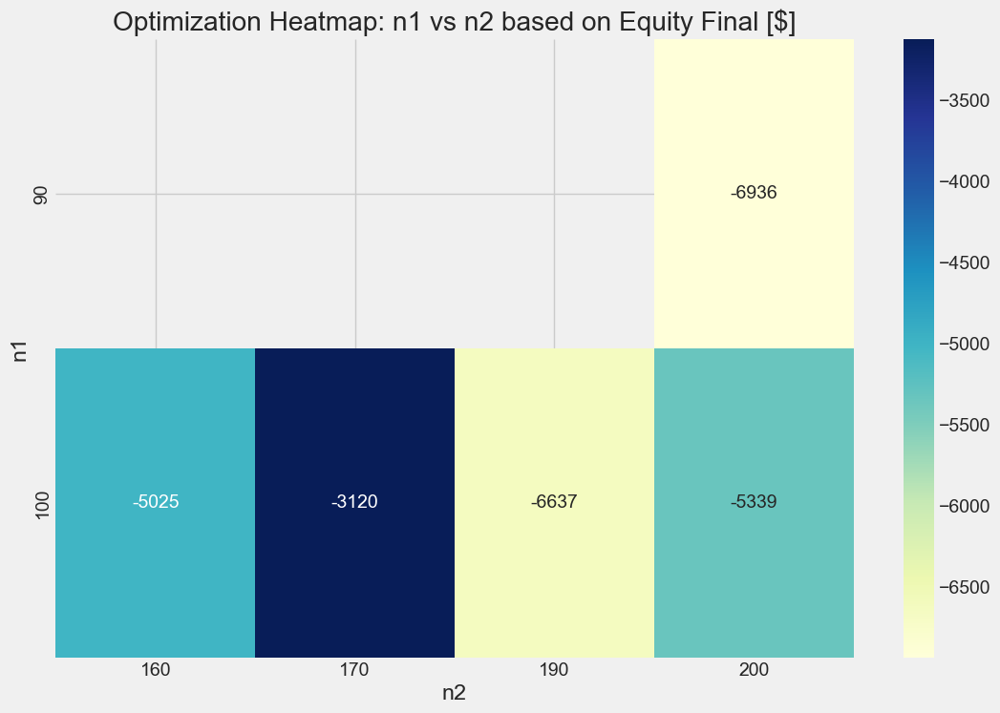

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data
x_values = optimize_result['xv']     # Parameter combinations
y_values = optimize_result['funv']   # Corresponding equity values

data = []
for x, y in zip(x_values, y_values):
    data.append({'n1': x[0], 'n2': x[1], 'Equity Final [$]': y})

results_df = pd.DataFrame(data)

# Optional filter for clean plot
filtered_df = results_df[(results_df['n1'] % 10 == 0) & (results_df['n2'] % 10 == 0)]

# ✅ Use pivot_table with aggregation (mean or max)
pivot_table = filtered_df.pivot_table(index='n1', columns='n2', values='Equity Final [$]', aggfunc='mean')

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap='YlGnBu')
plt.title('Optimization Heatmap: n1 vs n2 based on Equity Final [$]')
plt.xlabel("n2")
plt.ylabel("n1")
plt.show()
